# ESILV - Python for data analysis - devoir 2021

##### SALHI Nassim Djamil

This notebook will cover how to vizualise and create a classification model using the QSAR biodegradation Dataset.

Libraries Imports

In [34]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import os 
import pandas as pd 
from pylab import rcParams

### Dataset Import

In [35]:
df=pd.read_csv("./biodeg.csv", sep=';', header=None)

### Dataset Vizualisation

In [36]:
df.shape

(1055, 42)

We can see that this dataset containes 1055 entries is composed of 42 columns 


here is the columns description:

1) SpMax_L: Leading eigenvalue from Laplace matrix

2) J_Dz(e): Balaban-like index from Barysz matrix weighted by Sanderson
electronegativity 

3) nHM: Number of heavy atoms 

4) F01[N-N]: Frequency of N-N at topological distance 1 

5) F04[C-N]: Frequency of C-N at topological distance 4 

6) NssssC: Number of atoms of type ssssC 

7) nCb-: Number of substituted benzene C(sp2) 

8) C%: Percentage of C atoms 

9) nCp: Number of terminal primary C(sp3)


10) nO: Number of oxygen atoms

11) F03[C-N]: Frequency of C-N at topological distance 3

12) SdssC: Sum of dssC E-states

13) HyWi_B(m): Hyper-Wiener-like index (log function) from Burden matrix 
weighted by mass

14) LOC: Lopping centric index

15) SM6_L: Spectral moment of order 6 from Laplace matrix

16) F03[C-O]: Frequency of C - O at topological distance 3

17) Me: Mean atomic Sanderson electronegativity (scaled on Carbon atom)

18) Mi: Mean first ionization potential (scaled on Carbon atom)

19) nN-N: Number of N hydrazines

20) nArNO2: Number of nitro groups (aromatic)

21) nCRX3: Number of CRX3

22) SpPosA_B(p): Normalized spectral positive sum from Burden matrix weighted by polarizability

23) nCIR: Number of circuits

24) B01[C-Br]: Presence/absence of C - Br at topological distance 1

25) B03[C-Cl]: Presence/absence of C - Cl at topological distance 3

26) N-073: Ar2NH / Ar3N / Ar2N-Al / R..N..R

27) SpMax_A: Leading eigenvalue from adjacency matrix (Lovasz-Pelikan index)

28) Psi_i_1d: Intrinsic state pseudoconnectivity index - type 1d

29) B04[C-Br]: Presence/absence of C - Br at topological distance 4

30) SdO: Sum of dO E-states

31) TI2_L: Second Mohar index from Laplace matrix

32) nCrt: Number of ring tertiary C(sp3)

33) C-026: R--CX--R

34) F02[C-N]: Frequency of C - N at topological distance 2

35) nHDon: Number of donor atoms for H-bonds (N and O)

36) SpMax_B(m): Leading eigenvalue from Burden matrix weighted by mass

37) Psi_i_A: Intrinsic state pseudoconnectivity index - type S average

38) nN: Number of Nitrogen atoms

39) SM6_B(m): Spectral moment of order 6 from Burden matrix weighted by mass

40) nArCOOR: Number of esters (aromatic)

41) nX: Number of halogen atoms

42) experimental class: ready biodegradable (RB) and not ready biodegradable (NRB)

In [37]:
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41
0,3.919,2.6909,0,0,0,0,0,31.4,2,0,0,0.000,3.106,2.550,9.002,0,0.960,1.142,0,0,0,1.201,0,0,0,0,1.932,0.011,0,0.000,4.489,0,0,0,0,2.949,1.591,0,7.253,0,0,RB
1,4.170,2.1144,0,0,0,0,0,30.8,1,1,0,0.000,2.461,1.393,8.723,1,0.989,1.144,0,0,0,1.104,1,0,0,0,2.214,-0.204,0,0.000,1.542,0,0,0,0,3.315,1.967,0,7.257,0,0,RB
2,3.932,3.2512,0,0,0,0,0,26.7,2,4,0,0.000,3.279,2.585,9.110,0,1.009,1.152,0,0,0,1.092,0,0,0,0,1.942,-0.008,0,0.000,4.891,0,0,0,1,3.076,2.417,0,7.601,0,0,RB
3,3.000,2.7098,0,0,0,0,0,20.0,0,2,0,0.000,2.100,0.918,6.594,0,1.108,1.167,0,0,0,1.024,0,0,0,0,1.414,1.073,0,8.361,1.333,0,0,0,1,3.046,5.000,0,6.690,0,0,RB
4,4.236,3.3944,0,0,0,0,0,29.4,2,4,0,-0.271,3.449,2.753,9.528,2,1.004,1.147,0,0,0,1.137,0,0,0,0,1.985,-0.002,0,10.348,5.588,0,0,0,0,3.351,2.405,0,8.003,0,0,RB


The 41th column represent the class of the entry as we can see in the code below that we have 2 classes 'RB' and 'NRB'

In [38]:
df[41].unique()

array(['RB', 'NRB'], dtype=object)

Also we have 699 entries which represent the class NRB and 356 entries for the RB class

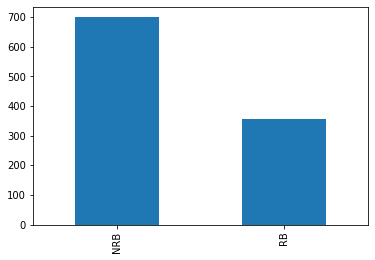

In [39]:
df[41].value_counts().plot.bar()

In [40]:
df.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40
count,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000,1055.000000
mean,4.782644,3.069508,0.716588,0.042654,0.980095,0.290047,1.646445,37.055640,1.376303,1.803791,1.436967,-0.197129,3.476844,1.350716,9.937381,3.630332,1.013302,1.131106,0.008531,0.073934,0.029384,1.238727,1.405687,0.039810,0.147867,0.031280,2.215641,-0.001206,0.026540,8.780510,2.668344,0.129858,0.883412,1.274882,0.961137,3.918240,2.558417,0.686256,8.629492,0.051185,0.723223
std,0.546916,0.831308,1.462452,0.256010,2.332955,1.073771,2.224822,9.144466,1.963521,1.775435,3.116577,0.769662,0.584150,0.786166,0.928678,4.457243,0.046494,0.030143,0.101802,0.317475,0.217997,0.096466,4.788542,0.195606,0.355137,0.199544,0.226131,0.158928,0.160812,11.895889,2.096607,0.644057,1.520467,2.273994,1.257013,0.999602,0.642765,1.090389,1.241986,0.318970,2.239286
min,2.000000,0.803900,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-5.256000,1.544000,0.000000,4.174000,0.000000,0.957000,1.022000,0.000000,0.000000,0.000000,0.863000,0.000000,0.000000,0.000000,0.000000,1.000000,-1.099000,0.000000,0.000000,0.444000,0.000000,0.000000,0.000000,0.000000,2.267000,1.467000,0.000000,4.917000,0.000000,0.000000
25%,4.481000,2.502750,0.000000,0.000000,0.000000,0.000000,0.000000,30.450000,0.000000,0.000000,0.000000,-0.191000,3.105000,0.875000,9.533000,0.000000,0.983000,1.116000,0.000000,0.000000,0.000000,1.182000,0.000000,0.000000,0.000000,0.000000,2.101000,-0.008000,0.000000,0.000000,1.446500,0.000000,0.000000,0.000000,0.000000,3.487500,2.103000,0.000000,7.991000,0.000000,0.000000
50%,4.828000,3.046300,0.000000,0.000000,0.000000,0.000000,1.000000,37.500000,1.000000,2.000000,0.000000,0.000000,3.442000,1.187000,10.039000,2.000000,1.003000,1.130000,0.000000,0.000000,0.000000,1.243000,1.000000,0.000000,0.000000,0.000000,2.247000,0.000000,0.000000,0.000000,2.052000,0.000000,0.000000,0.000000,1.000000,3.726000,2.458000,0.000000,8.499000,0.000000,0.000000
75%,5.125000,3.437650,1.000000,0.000000,1.000000,0.000000,3.000000,43.400000,2.000000,3.000000,2.000000,0.000000,3.825500,1.705000,10.514500,6.000000,1.029000,1.143000,0.000000,0.000000,0.000000,1.296000,2.000000,0.000000,0.000000,0.000000,2.358000,0.005000,0.000000,12.465000,3.146000,0.000000,1.000000,2.000000,2.000000,3.987000,2.870500,1.000000,9.020500,0.000000,0.000000
max,6.496000,9.177500,12.000000,3.000000,36.000000,13.000000,18.000000,60.700000,24.000000,12.000000,44.000000,4.722000,5.701000,4.491000,12.609000,40.000000,1.311000,1.377000,2.000000,3.000000,3.000000,1.641000,147.000000,1.000000,1.000000,3.000000,2.859000,1.073000,1.000000,71.167000,17.537000,8.000000,12.000000,18.000000,7.000000,10.695000,5.825000,8.000000,14.700000,4.000000,27.000000


In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1055 entries, 0 to 1054
Data columns (total 42 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       1055 non-null   float64
 1   1       1055 non-null   float64
 2   2       1055 non-null   int64  
 3   3       1055 non-null   int64  
 4   4       1055 non-null   int64  
 5   5       1055 non-null   int64  
 6   6       1055 non-null   int64  
 7   7       1055 non-null   float64
 8   8       1055 non-null   int64  
 9   9       1055 non-null   int64  
 10  10      1055 non-null   int64  
 11  11      1055 non-null   float64
 12  12      1055 non-null   float64
 13  13      1055 non-null   float64
 14  14      1055 non-null   float64
 15  15      1055 non-null   int64  
 16  16      1055 non-null   float64
 17  17      1055 non-null   float64
 18  18      1055 non-null   int64  
 19  19      1055 non-null   int64  
 20  20      1055 non-null   int64  
 21  21      1055 non-null   float64
 22  

### Preprocessing the dataset

here we change the classes to numerical values so we can execute the machine learning modele 

In [42]:
new_values = {'RB':  1, 'NRB': 0} 

df[41] = df[41].map(new_values)

In [43]:
df[41].unique()

array([1, 0])

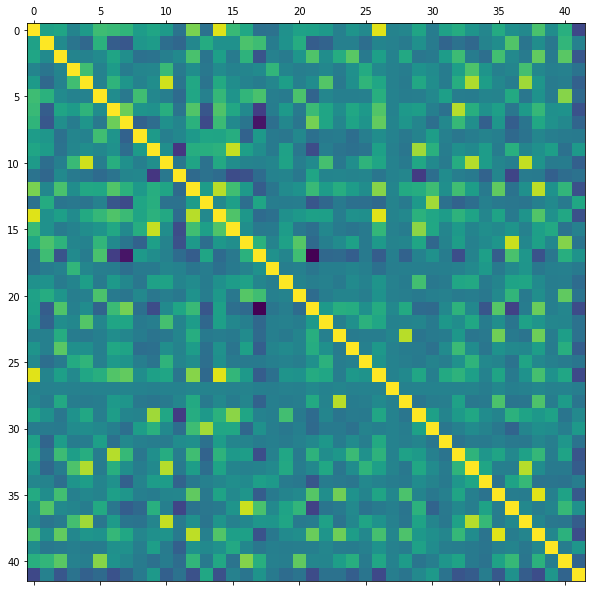

In [101]:

rcParams['figure.figsize'] = 5, 10
plt.matshow(df.corr())
plt.show()

In [117]:
rcParams['figure.figsize'] = 250, 500
pd.plotting.scatter_matrix(df, alpha=0.2)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f5334a3a240>,
        ...,
        ...,
        ...,
       ...,
        ...,
        ...,
        ...,
      dtype=object)

In [44]:
feature_names = [i for i in range(0,41)]
X = df[feature_names]
y = df[41]

Text(0.5, 1.0, 'PCA of biodeg dataset')

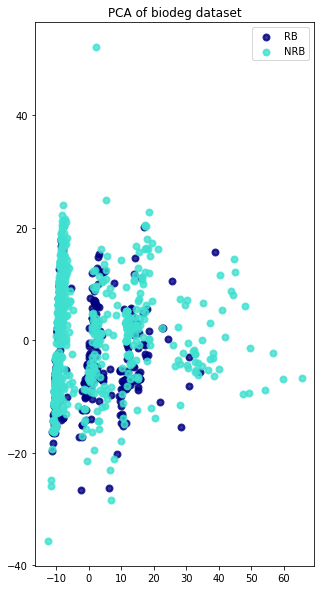

In [45]:
rcParams['figure.figsize'] = 5, 10
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_r = pca.fit(X).transform(X)

plt.figure()
colors = ['navy', 'turquoise']

lw = 2

for color, i, target_name in zip(colors, [1, 0], ['RB', 'NRB']):
    plt.scatter(X_r[y == i, 0], X_r[y == i, 1], color=color, alpha=.8, lw=lw,
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA of biodeg dataset')

Using the PCA we can see that the dataset is most likely to not be lineraly separable but we cannot be sure 100% since we have some data lose when moving from a 41D dataset to a 2D one.

### Training the models 

In [46]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [47]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
print('Accuracy of Logistic regression classifier on training set: {:.2f}'
     .format(logreg.score(X_train, y_train)))
print('Accuracy of Logistic regression classifier on test set: {:.2f}'
     .format(logreg.score(X_test, y_test)))
pred_logreg = logreg.predict(X_test)

Accuracy of Logistic regression classifier on training set: 0.85
Accuracy of Logistic regression classifier on test set: 0.83


In [48]:
from sklearn.metrics import classification_report
print(classification_report(y_test, pred_logreg, target_names=['NRB', 'RB']))

              precision    recall  f1-score   support

         NRB       0.91      0.85      0.88       152
          RB       0.67      0.80      0.73        59

    accuracy                           0.83       211
   macro avg       0.79      0.82      0.80       211
weighted avg       0.85      0.83      0.84       211



In [49]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier().fit(X_train, y_train)
print('Accuracy of Decision Tree classifier on training set: {:.2f}'
     .format(clf.score(X_train, y_train)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}'
     .format(clf.score(X_test, y_test)))
pred_clf = clf.predict(X_test)

Accuracy of Decision Tree classifier on training set: 1.00
Accuracy of Decision Tree classifier on test set: 0.84


In [50]:
from sklearn.metrics import classification_report
print(classification_report(y_test, pred_clf, target_names=['NRB', 'RB']))

              precision    recall  f1-score   support

         NRB       0.93      0.85      0.89       152
          RB       0.68      0.83      0.75        59

    accuracy                           0.84       211
   macro avg       0.80      0.84      0.82       211
weighted avg       0.86      0.84      0.85       211



In [51]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
print('Accuracy of K-NN classifier on training set: {:.2f}'
     .format(knn.score(X_train, y_train)))
print('Accuracy of K-NN classifier on test set: {:.2f}'
     .format(knn.score(X_test, y_test)))
pred_knn = knn.predict(X_test)

Accuracy of K-NN classifier on training set: 0.89
Accuracy of K-NN classifier on test set: 0.83


In [52]:
from sklearn.metrics import classification_report
print(classification_report(y_test, pred_knn, target_names=['NRB', 'RB']))

              precision    recall  f1-score   support

         NRB       0.93      0.83      0.88       152
          RB       0.65      0.83      0.73        59

    accuracy                           0.83       211
   macro avg       0.79      0.83      0.80       211
weighted avg       0.85      0.83      0.83       211



In [53]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
lda = LinearDiscriminantAnalysis()
lda.fit(X_train, y_train)
print('Accuracy of LDA classifier on training set: {:.2f}'
     .format(lda.score(X_train, y_train)))
print('Accuracy of LDA classifier on test set: {:.2f}'
     .format(lda.score(X_test, y_test)))
pred_lda = lda.predict(X_test)

Accuracy of LDA classifier on training set: 0.88
Accuracy of LDA classifier on test set: 0.85


In [54]:
from sklearn.metrics import classification_report
print(classification_report(y_test, pred_lda, target_names=['NRB', 'RB']))

              precision    recall  f1-score   support

         NRB       0.92      0.87      0.89       152
          RB       0.70      0.80      0.75        59

    accuracy                           0.85       211
   macro avg       0.81      0.83      0.82       211
weighted avg       0.86      0.85      0.85       211



In [55]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_train)
print('Accuracy of GNB classifier on training set: {:.2f}'
     .format(gnb.score(X_train, y_train)))
print('Accuracy of GNB classifier on test set: {:.2f}'
     .format(gnb.score(X_test, y_test)))
pred_gnb = gnb.predict(X_test)

Accuracy of GNB classifier on training set: 0.68
Accuracy of GNB classifier on test set: 0.62


In [56]:
from sklearn.metrics import classification_report
print(classification_report(y_test, pred_gnb, target_names=['NRB', 'RB']))

              precision    recall  f1-score   support

         NRB       0.97      0.49      0.65       152
          RB       0.42      0.97      0.59        59

    accuracy                           0.62       211
   macro avg       0.70      0.73      0.62       211
weighted avg       0.82      0.62      0.63       211



In [57]:
from sklearn.svm import SVC
svm = SVC()
svm.fit(X_train, y_train)
print('Accuracy of SVM classifier on training set: {:.2f}'
     .format(svm.score(X_train, y_train)))
print('Accuracy of SVM classifier on test set: {:.2f}'
     .format(svm.score(X_test, y_test)))
pred_svm = svm.predict(X_test)

Accuracy of SVM classifier on training set: 0.87
Accuracy of SVM classifier on test set: 0.85


In [58]:
from sklearn.metrics import classification_report
print(classification_report(y_test, pred_svm, target_names=['NRB', 'RB']))

              precision    recall  f1-score   support

         NRB       0.93      0.86      0.89       152
          RB       0.70      0.83      0.76        59

    accuracy                           0.85       211
   macro avg       0.81      0.85      0.83       211
weighted avg       0.87      0.85      0.86       211



Here we can see that the both the decision tree and the logistic regression have the best result but the decision tree is slightly better when we compare the presicion by classes the problem with this dataset is that the classes are not equaly distributed (we have 699 entries NRB and 356 entries for the RB class) and this can make the model 'think' that most of the entries must be in the NRB class and we can see that in the accuracy of GaussianNB model where we have 97% accuracy for the class NRB and  42% for the RB class  

### Creating the API using Flask

packages installation

For the api we choose to use the Decision Tree model that was pré trained

In [59]:
!pip install flask-ngrok

In [60]:
pip install flask-restful

Imports

In [61]:
from sklearn.externals import joblib
from flask_ngrok import run_with_ngrok
from flask import Flask
from flask_restful import Api, Resource, reqparse
from sklearn.externals import joblib
import numpy as np

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


In [62]:
# serialize model
joblib.dump(clf, 'biodeg.mdl')

['biodeg.mdl']

In [63]:
app = Flask(__name__)
run_with_ngrok(app)   #starts ngrok when the app is run only for google colab
API = Api(app)
BIO_MODEL = joblib.load('biodeg.mdl')
@app.route("/")
def home():
    return "<!DOCTYPE html>\
    <html>\
    <body>\
    <h2>HTML Forms</h2>\
    <form method='post' action='/predict'>\
    <label for='SpMax_L'>SpMax_L:</label><br>\
    <input type='text' id='SpMax_L' name='SpMax_L' value=''><br>\
    <label for='J_Dz(e)'>J_Dz(e):</label><br>\
    <input type='text' id='J_Dz(e)' name='J_Dz(e)' value=''><br>\
    <label for='nHM'>nHM:</label><br>\
     <input type='text' id='nHM' name='nHM' value=''><br>\
     <label for='F01[N-N]'>F01[N-N]:</label><br>\
     <input type='text' id='F01[N-N]' name='F01[N-N]' value=''><br>\
     <label for='F04[C-N]'>F04[C-N]:</label><br>\
     <input type='text' id='F04[C-N]' name='F04[C-N]' value=''><br>\
     <label for='NssssC'>NssssC:</label><br>\
     <input type='text' id='NssssC' name='NssssC' value=''><br>\
     <label for='nCb-'>nCb-:</label><br>\
     <input type='text' id='nCb-' name='nCb-' value=''><br>\
     <label for='C%'>C%:</label><br>\
     <input type='text' id='C%' name='C%' value=''><br>\
     <label for='nCp'>nCp:</label><br>\
     <input type='text' id='nCp' name='nCp' value=''><br>\
     <label for='nO'>nO:</label><br>\
     <input type='text' id='nO' name='nO' value=''><br>\
     <label for='F03[C-N]'>F03[C-N]:</label><br>\
     <input type='text' id='F03[C-N]' name='F03[C-N]' value=''><br>\
     <label for='SdssC'>SdssC:</label><br>\
     <input type='text' id='SdssC' name='SdssC' value=''><br>\
     <label for='HyWi_B(m)'>HyWi_B(m):</label><br>\
     <input type='text' id='HyWi_B(m)' name='HyWi_B(m)' value=''><br>\
     <label for='LOC'>LOC:</label><br>\
     <input type='text' id='LOC' name='LOC' value=''><br>\
     <label for='SM6_L'>SM6_L:</label><br>\
     <input type='text' id='SM6_L' name='SM6_L' value=''><br>\
     <label for='F03[C-O]'>F03[C-O]:</label><br>\
     <input type='text' id='F03[C-O]' name='F03[C-O]' value=''><br>\
     <label for='Me'>Me:</label><br>\
     <input type='text' id='Me' name='Me' value=''><br>\
     <label for='Mi'>Mi:</label><br>\
     <input type='text' id='Mi' name='Mi' value=''><br>\
     <label for='nN-N'>nN-N:</label><br>\
     <input type='text' id='nN-N' name='nN-N' value=''><br>\
     <label for='nArNO2'>nArNO2:</label><br>\
     <input type='text' id='nArNO2' name='nArNO2' value=''><br>\
     <label for='nCRX3'>nCRX3:</label><br>\
     <input type='text' id='nCRX3' name='nCRX3' value=''><br>\
     <label for='SpPosA_B(p)'>SpPosA_B(p):</label><br>\
     <input type='text' id='SpPosA_B(p)' name='SpPosA_B(p)' value=''><br>\
     <label for='nCIR'>nCIR:</label><br>\
     <input type='text' id='nCIR' name='nCIR' value=''><br>\
     <label for='B01[C-Br]'>B01[C-Br]:</label><br>\
     <input type='text' id='B01[C-Br]' name='B01[C-Br]' value=''><br>\
     <label for='B03[C-Cl]'>B03[C-Cl]:</label><br>\
     <input type='text' id='B03[C-Cl]' name='B03[C-Cl]' value=''><br>\
     <label for='N-073'>N-073:</label><br>\
     <input type='text' id='N-073' name='N-073' value=''><br>\
     <label for='SpMax_A'>SpMax_A:</label><br>\
     <input type='text' id='SpMax_A' name='SpMax_A' value=''><br>\
     <label for='Psi_i_1d'>Psi_i_1d:</label><br>\
     <input type='text' id='Psi_i_1d' name='Psi_i_1d' value=''><br>\
     <label for='B04[C-Br]'>B04[C-Br]:</label><br>\
     <input type='text' id='B04[C-Br]' name='B04[C-Br]' value=''><br>\
     <label for='SdO'>SdO:</label><br>\
     <input type='text' id='SdO' name='SdO' value=''><br>\
    <label for='TI2_L'>TI2_L:</label><br>\
    <input type='text' id='TI2_L' name='TI2_L' value=''><br>\
    <label for='nCrt'>nCrt:</label><br>\
    <input type='text' id='nCrt' name='nCrt' value=''><br>\
    <label for='C-026'>C-026:</label><br>\
    <input type='text' id='C-026' name='C-026' value=''><br>\
    <label for='F02[C-N]'>F02[C-N]:</label><br>\
  <input type='text' id='F02[C-N]' name='F02[C-N]' value=''><br>\
    <label for='nHDon'>nHDon:</label><br>\
    <input type='text' id='nHDon' name='nHDon' value=''><br>\
    <label for='SpMax_B(m)'>SpMax_B(m):</label><br>\
    <input type='text' id='SpMax_B(m)' name='SpMax_B(m)' value=''><br>\
    <label for='Psi_i_A'>Psi_i_A:</label><br>\
    <input type='text' id='Psi_i_A' name='Psi_i_A' value=''><br>\
<label for='nN'>nN:</label><br>\
<input type='text' id='nN' name='nN' value=''><br>\
<label for='SM6_B(m)'>SM6_B(m):</label><br>\
<input type='text' id='SM6_B(m)' name='SM6_B(m)' value=''><br>\
<label for='nArCOOR'>nArCOOR:</label><br>\
<input type='text' id='nArCOOR' name='nArCOOR' value=''><br>  \
<label for='nX'>nX:</label><br>\
<input type='text' id='nX' name='nX' value=''><br>  \
<br>\
<input type='submit' value='Submit'>\
</form> \
</body>\
</html>" 


In [65]:
class Predict(Resource):

    @staticmethod
    def post():
        parser = reqparse.RequestParser()
        parser.add_argument('SpMax_L')
        parser.add_argument('J_Dz(e)')
        parser.add_argument('nHM')
        parser.add_argument('F01[N-N]')
        parser.add_argument('F04[C-N]')
        parser.add_argument('NssssC')
        parser.add_argument('nCb-')
        parser.add_argument('C%')
        parser.add_argument('nCp')
        parser.add_argument('nO')
        parser.add_argument('F03[C-N]')
        parser.add_argument('SdssC')
        parser.add_argument('HyWi_B(m)')
        parser.add_argument('LOC')
        parser.add_argument('SM6_L')
        parser.add_argument('F03[C-O]')
        parser.add_argument('Me')
        parser.add_argument('Mi')
        parser.add_argument('nN-N')
        parser.add_argument('nArNO2')
        parser.add_argument('nCRX3')
        parser.add_argument('SpPosA_B(p)')
        parser.add_argument('nCIR')
        parser.add_argument('B01[C-Br]')
        parser.add_argument('B03[C-Cl]')
        parser.add_argument('N-073')
        parser.add_argument('SpMax_A')
        parser.add_argument('Psi_i_1d')
        parser.add_argument('B04[C-Br]')
        parser.add_argument('SdO')
        parser.add_argument('TI2_L')
        parser.add_argument('nCrt')
        parser.add_argument('C-026')
        parser.add_argument('F02[C-N]')
        parser.add_argument('nHDon')
        parser.add_argument('SpMax_B(m)')
        parser.add_argument('Psi_i_A')
        parser.add_argument('nN')
        parser.add_argument('SM6_B(m)')
        parser.add_argument('nArCOOR')
        parser.add_argument('nX')


        args = parser.parse_args()  # creates dict
        print(args.values())
        X_new = np.fromiter(args.values(), dtype=float)  # convert input to array
        out = {'Prediction': BIO_MODEL.predict([X_new])[0]}
        print(out)
        return out, 200

In [66]:
API.add_resource(Predict, '/predict')

In [100]:
app.run()

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://127.0.0.1:5000/ (Press CTRL+C to quit)


 * Running on http://445917486b07.ngrok.io
 * Traffic stats available on http://127.0.0.1:4040


127.0.0.1 - - [09/Jan/2021 20:31:09] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [09/Jan/2021 20:31:09] "GET /favicon.ico HTTP/1.1" 404 -
127.0.0.1 - - [09/Jan/2021 20:31:40] "POST /predict HTTP/1.1" 200 -


dict_values(['1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1'])
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
{'Prediction': 1}
